<b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов.

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?


---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>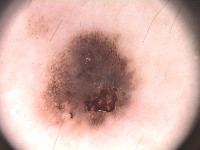</td><td>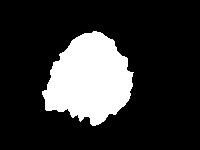</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

#### Настройка среды

In [350]:
from skimage.io import imread
import os
import matplotlib.pyplot as plt
from IPython.display import clear_output
from skimage.transform import resize
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time
import pandas as pd
from IPython.display import clear_output
import gc
from matplotlib import rcParams
from torch.autograd import Variable
import seaborn as sns

In [219]:
SEED = 42

np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [220]:
print(plt.style.available)
plt.style.use('seaborn-darkgrid')

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


/tmp/ipykernel_47/810119066.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-darkgrid')


In [221]:
#!wget -c https://www.dropbox.com/s/8lqrloi0mxj2acu/PH2Dataset.rar

In [222]:
!ls

In [223]:
#get_ipython().system_raw("unzip x /content/drive/MyDrive/PH2Dataset.zip")
get_ipython().system_raw("unzip /content/drive/MyDrive/PH2Dataset.zip -d /content/")

unzip:  cannot find or open /content/drive/MyDrive/PH2Dataset.zip, /content/drive/MyDrive/PH2Dataset.zip.zip or /content/drive/MyDrive/PH2Dataset.zip.ZIP.


Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [224]:
images, lesions = [], []
for root, dirs, files in os.walk('/kaggle/input/ph2dataset/PH2Dataset/PH2_Dataset/'):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))
len(images), len(lesions)

(200, 200)

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [225]:
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [226]:
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [227]:
len(lesions)

200

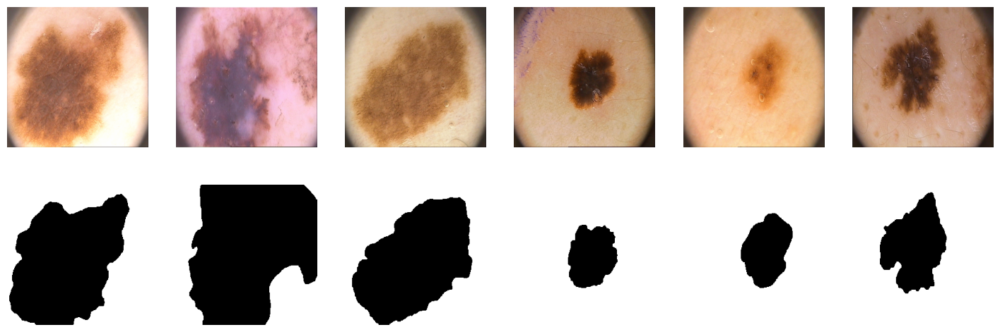

In [228]:
plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50 для обучения, валидации и теста соответственно

In [229]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [230]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [231]:
batch_size = 16
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [232]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet

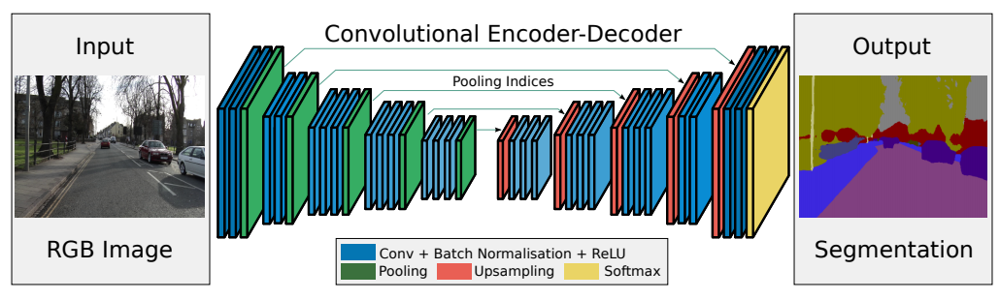

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [233]:
rcParams['figure.figsize'] = (15,4)

In [234]:
class SegNet(nn.Module):
    def __init__(self, fl_ch: int):
        super().__init__()
        """
        fl_ch - First layer channels
        Для быстрого изменеия обучаемых параметров нейросети
        заданим аргумент с количествов выодных каналов после первого слоя свертки
        """
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(2, return_indices=True) # 256 -> 128
        self.enc_conv1 =nn.Sequential(
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch * 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch* 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU()
        )
        self.pool1 =  nn.MaxPool2d(2, return_indices=True)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch * 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch* 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU()
        )
        self.pool2 =  nn.MaxPool2d(2, return_indices=True)# 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch * 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 8, out_channels = fl_ch* 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU()
        )
        self.pool3 =  nn.MaxPool2d(2, return_indices=True)# 32 -> 16

        # bottleneck
        self.bottleneck_conv = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch*8, out_channels = fl_ch*16, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch*16, out_channels = fl_ch*16, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch*16, out_channels = fl_ch*16, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU()
        )

        self.bottleneck_pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.bottleneck_upsample = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.bottleneck_dec = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*16, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*16, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU()
        )

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU()
        )

        self.upsample1 = nn.MaxUnpool2d(2) # 32 -> 64

        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU()
        )

        self.upsample2 = nn.MaxUnpool2d(2)  # 64 -> 128

        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(2)  # 128 -> 256

        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch, out_channels=1, kernel_size=3, padding = 1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e0, ind0 = self.pool0(e0)
        e1 = self.enc_conv1(e0)
        e1, ind1 = self.pool1(e1)
        e2 = self.enc_conv2(e1)
        e2, ind2 = self.pool2(e2)
        e3 = self.enc_conv3(e2)
        e3, ind3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(e3)
        b, ind_b = self.bottleneck_pool(b)
        b = self.bottleneck_upsample(b, ind_b)
        b = self.bottleneck_dec(b)

        # decoder
        d0 = self.upsample0(b, ind3)
        d0 = self.dec_conv0(d0)
        d1 = self.upsample1(d0, ind2)
        d1 = self.dec_conv1(d1)
        d2 = self.upsample2(d1, ind1)
        d2 = self.dec_conv2(d2)
        d3 = self.upsample3(d2, ind0)
        d3 = self.dec_conv3(d3) # no activation
        return d3

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [235]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0

    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0

#    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds

    return iou # thresholded

## Функция потерь

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации.

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [236]:
def bce_loss(y_pred, y_real):
    loss = (1 - y_real) * y_pred + torch.log(1 + torch.exp(-y_pred))
    return loss.mean()

In [237]:
s1 = torch.randn(10, 3, 256, 256)
s2 = torch.randn(10, 3, 256, 256)
print(nn.BCEWithLogitsLoss()(s1, s2), bce_loss(s1, s2))

tensor(0.8059) tensor(0.8059)


## Тренировка

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [238]:
MAX_EPOCHS = 50

In [239]:
def empty_cash(X_batch, Y_batch, Xv_batch, Yv_batch, model):
  X_batch.to("cpu")
  Y_batch.to("cpu")
  Xv_batch.to("cpu")
  Yv_batch.to("cpu")
  del model
  del X_batch
  del Y_batch
  del Xv_batch
  del Yv_batch
  torch.cuda.empty_cache()

In [240]:
def viz(ax, X_val, Y_hat, Y_val):
  for k in range(6):
    ax[0, k].imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
    ax[0, k].set_title("Real")
    ax[0, k].axis('off')
    ax[1, k].imshow(torch.sigmoid(Y_hat[k, 0]) > 0.5, cmap='gray')
    ax[1, k].set_title("Output")
    ax[1, k].axis('off')
    ax[2, k].imshow(Y_val[k, 0], cmap='gray')
    ax[2, k].set_title("Ground Truth")
    ax[2, k].axis('off')

In [241]:
def train(model, optimizer, loss_fn, epochs, data_tr, data_val):
    X_val, Y_val = next(iter(data_val))
    history = {"epochs": np.arange(epochs)+1, "train": {"score": [], "loss": []},  "val": {"score": [], "loss": []}}

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        avg_score = 0
        avg_loss_val = 0
        avg_score_val = 0

        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            X_batch = X_batch.to(device)  # data to device
            Y_batch = Y_batch.to(device)  # data to device

            # set parameter gradients to zero
            optimizer.zero_grad()

            # forward
            Y_pred = model(X_batch)
            loss =  loss_fn(Y_pred, Y_batch) # forward-pass
            loss.backward()  # backward-pass
            optimizer.step()  # update weights
            score = iou_pytorch(torch.sigmoid(Y_pred) > 0.5, Y_batch).mean().item()

            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
            avg_score += score/ len(data_tr)
        toc = time()
        print('loss: %f' % avg_loss)

        # show intermediate results
        model.eval()  # testing mode
        Y_hat = model(X_val.to(device)).detach().to("cpu") # detach and put into cpu
        loss_val = loss

        # Visualize tools
        clear_output(wait=True)

        for Xv_batch, Yv_batch in data_val:
            Xv_batch = Xv_batch.to(device)
            Yv_batch = Yv_batch.to(device)
            Y_pred_val = model(Xv_batch)
            loss_val = loss_fn(Y_pred_val, Yv_batch)
            score_val = iou_pytorch(torch.sigmoid(Y_pred_val) > 0.5, Yv_batch).mean().item()
            avg_loss_val += loss / len(data_val)
            avg_score_val += score_val/ len(data_val)
        # заполнение словаря
        history["train"]["score"].append(avg_score)
        history["val"]["score"].append(avg_score_val)
        history["train"]["loss"].append(avg_loss.item())
        history["val"]["loss"].append(avg_loss_val.item())
        # отрисовка графиков
        fig, ax = plt.subplots(3, 6, figsize = (14, 12))
        viz(ax, X_val, Y_hat, Y_val)
        plt.suptitle('%d / %d - train_loss: %f , val_loss: %f, train_score: %f, val_score: %f' % (epoch+1, epochs, avg_loss, avg_loss_val, avg_score, avg_score_val))
        plt.tight_layout()
        plt.show()

    empty_cash(X_batch, Y_batch, Xv_batch, Yv_batch, model)

    return history

## Инференс

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [242]:
#Функция для построения графиков лосса и скора по эпохам
def plot_graph(ax, x, y_train, y_val, title, ylabel):
   ax.plot(x, y_train, label = "train")
   ax.plot(x, y_val, label = "val")
   ax.legend(fontsize = 14)
   ax.grid(linestyle = "--")
   ax.tick_params(labelsize = 14)
   ax.set_xlabel("epoch", fontsize = 14)
   ax.set_ylabel(ylabel, fontsize = 14)
   ax.set_title(title, fontsize = 16)
   ax.set_xlim(left = 0, right = x.max())
   ax.set_ylim(bottom = 0)

def make_graph(history, model_name, loss_name):
   fig, axs = plt.subplots(1, 2, figsize = (14, 7))
   x = history["epochs"]
   loss_train = history["train"]["loss"]
   loss_val = history["val"]["loss"]
   score_train = history["train"]["score"]
   score_val = history["val"]["score"]

   plot_graph(axs[0], x, loss_train, loss_val, "Loss vs epoch", "loss")
   plot_graph(axs[1], x, score_train, score_val, "Score vs epoch", "score")

   plt.suptitle(f"Model = {model_name}, loss = {loss_name}", fontsize = 18, y=1.05)
   plt.tight_layout()
   plt.subplots_adjust(wspace=0.4)
   plt.show()

In [243]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = torch.sigmoid(model(X_batch.to(device))) > 0.5
        scores += metric(Y_pred, Y_label.to(device)).mean().item()
    return scores/len(data)

#Функция для вычисления скора на валидации и тесте уже обученной модели
def scores(model):
    val_score = score_model(model, iou_pytorch, data_val)
    test_score = score_model(model, iou_pytorch, data_ts)
    print(f"\nScore на валидации: {val_score:.4f}, score на тесте: {test_score:.4f}")
    return val_score, test_score

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


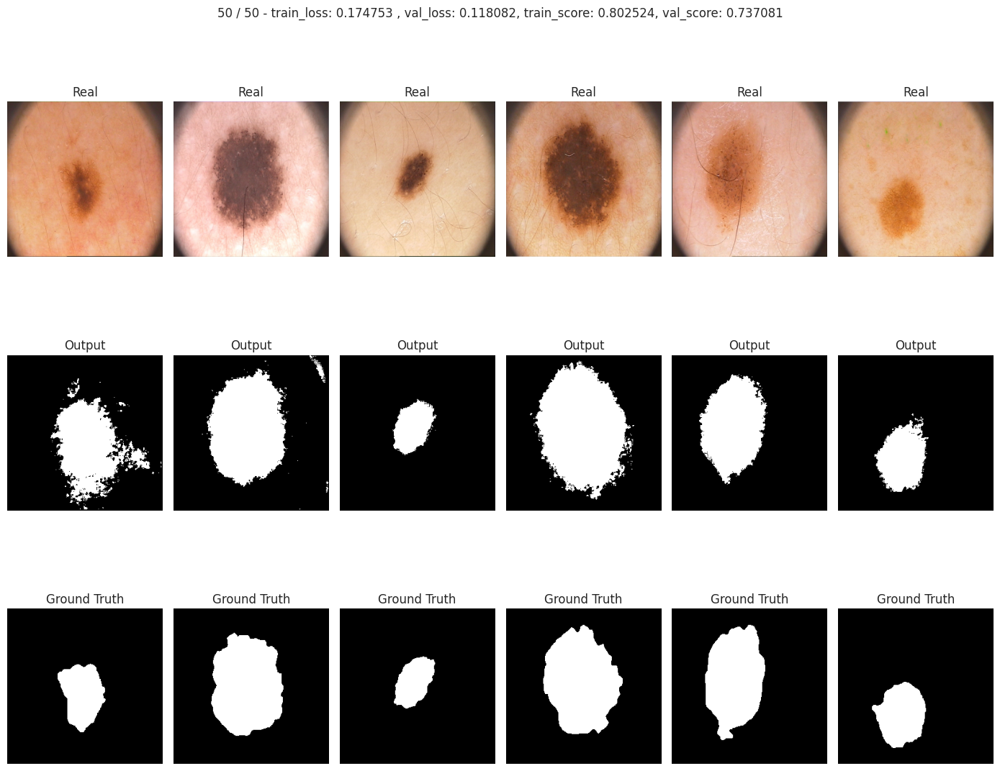

In [244]:
model = SegNet(32).to(device)
optimizer = torch.optim.AdamW(model.parameters())
h_segnet_bce = train(model, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val)

In [245]:
segnet_bce_val_score, segnet_bce_test_score = scores(model)


Score на валидации: 0.7813, score на тесте: 0.7573


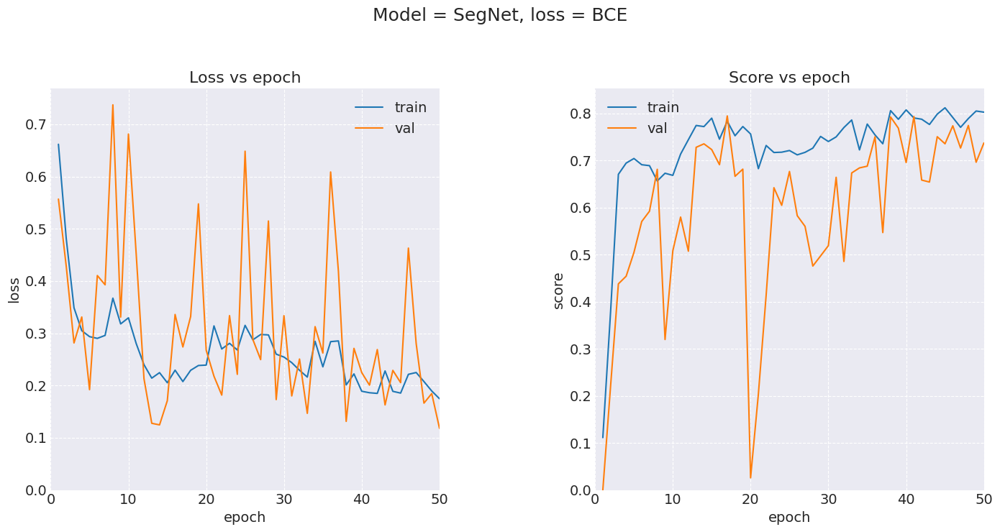

In [246]:
make_graph(h_segnet_bce, "SegNet", "BCE")

Ответьте себе на вопрос: не переобучается ли моя модель?

Переобучение может характеризоваться следующими показателями:
1. На трейне качество растет а на валидации падает
2. Лосс на валидации растет а на трейне падает

В целом данная модель устойчива к переобучению.

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.

### 1. Dice loss

In [247]:
def dice_loss(y_pred, y_real, smooth=1e-6): #параметр smooth решает проблему возможной нестабильности функции
    y_pred = torch.sigmoid(y_pred)
    num = 2. * torch.sum(y_real * y_pred) + smooth
    den = torch.sum(y_real + y_pred) + smooth
    res = 1 - (num/den)
    return res

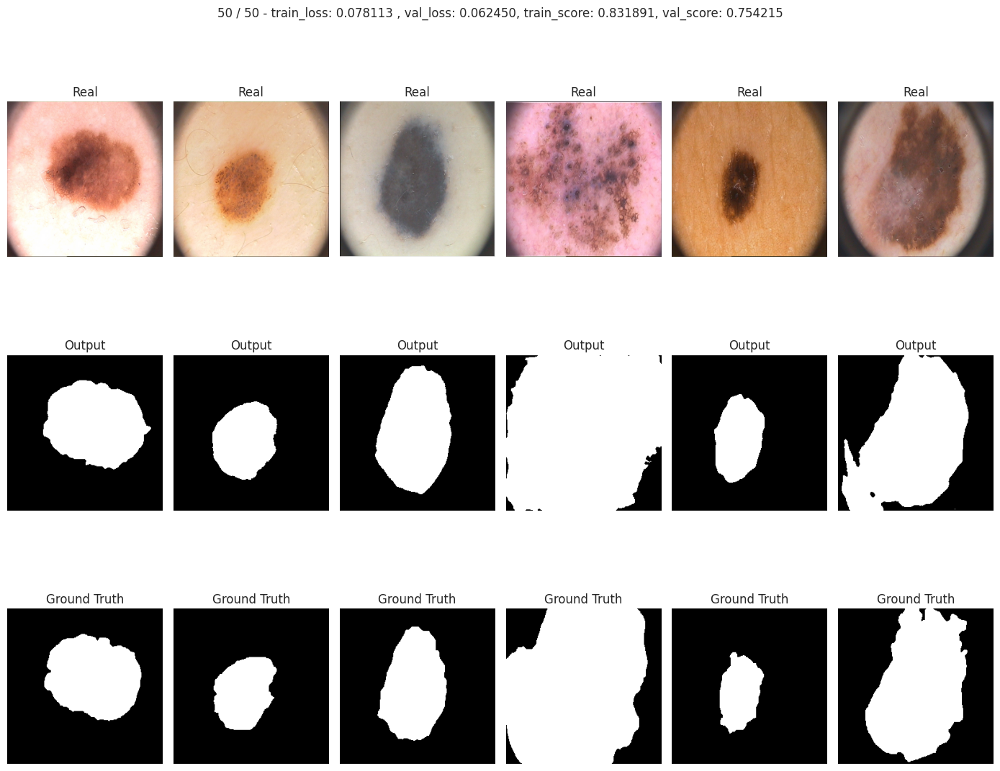

In [291]:
model_dice = SegNet(32).to(device)

optimaizer = optim.AdamW(model_dice.parameters())
h_segnet_dice = train(model_dice, optimaizer, dice_loss, MAX_EPOCHS, data_tr, data_val)

In [292]:
segnet_dice_val_score, segnet_dice_test_score = scores(model_dice)


Score на валидации: 0.8092, score на тесте: 0.7681


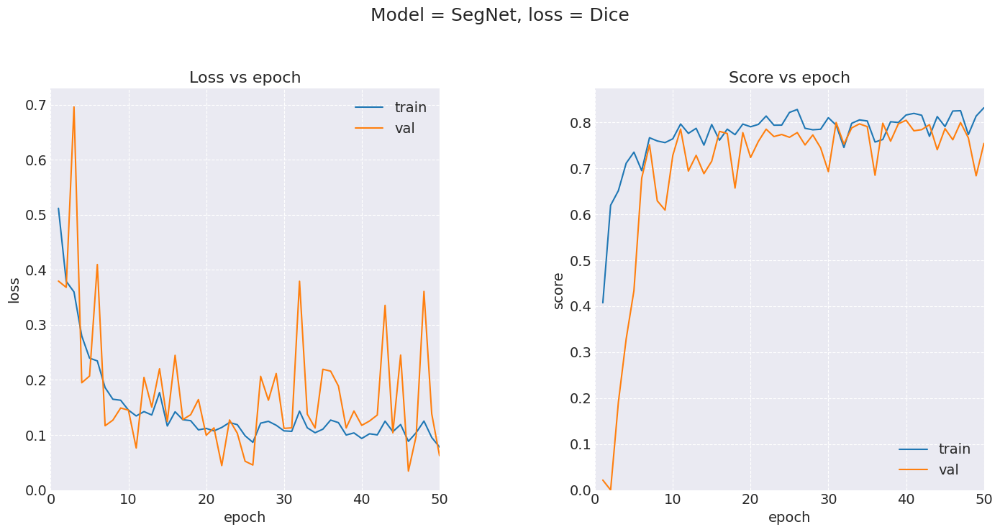

In [312]:
make_graph(h_segnet_dice, "SegNet", "Dice")

### [Focal loss](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------

In [251]:
def focal_loss(y_pred, y_real, eps = -1, gamma = 2):
    inputs = F.sigmoid(y_pred)
    BCE = F.binary_cross_entropy(inputs, y_real, reduction='mean')
    BCE_EXP = torch.exp(-BCE)
    focal_loss = (1-BCE_EXP)**gamma * BCE
    return focal_loss

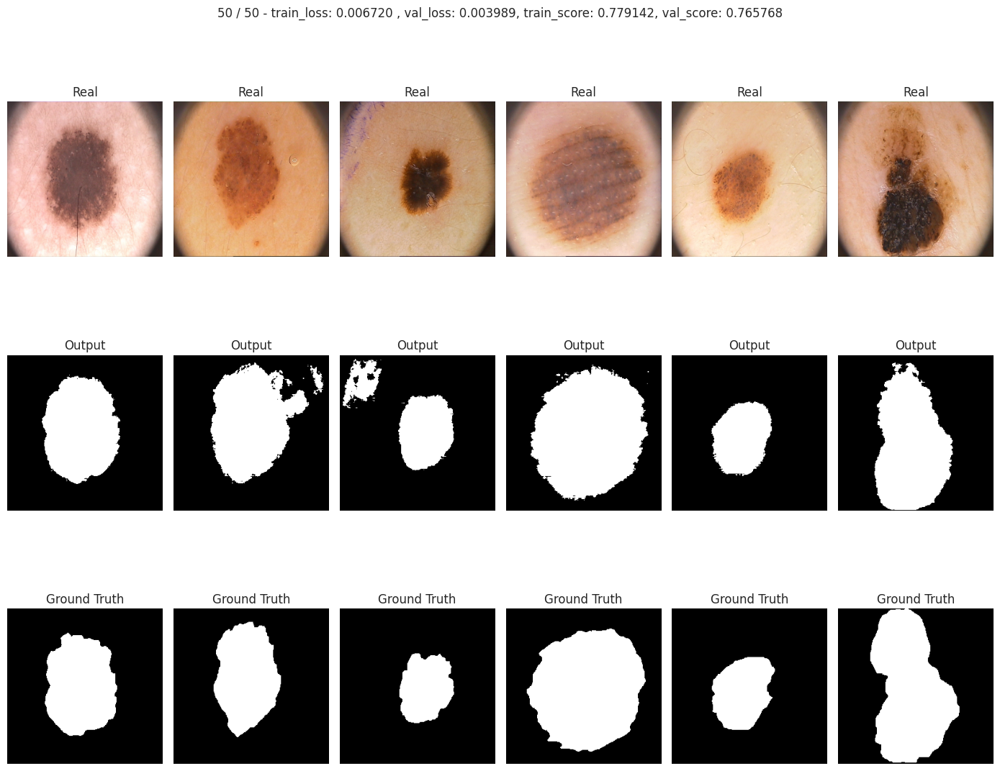

In [294]:
model_focal = SegNet(32).to(device)

optimaizer = optim.AdamW(model_focal.parameters())
h_segnet_focal = train(model_focal, optimaizer, focal_loss, MAX_EPOCHS, data_tr, data_val)

In [341]:
segnet_focal_val_score, segnet_focal_test_score = scores(model_focal)


Score на валидации: 0.7154, score на тесте: 0.7467


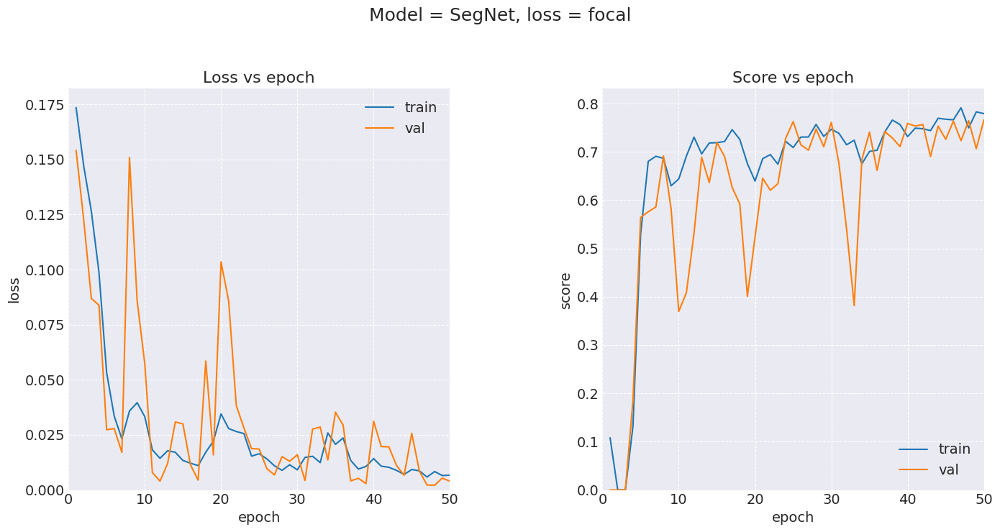

In [313]:
make_graph(h_segnet_focal, "SegNet", "focal")

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты?

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

* [Имплементация различных функций потерь (очень большая подборка)](https://github.com/JunMa11/SegLoss)

**Я проведу подробное сравнение уже в отчете.**

In [255]:
#hhttps://github.com/bermanmaxim/LovaszSoftmax/blob/master/pytorch/lovasz_losses.py
def lovasz_loss(logits, labels, per_image=True, ignore=None):
    """
    Binary Lovasz hinge loss
      logits: [B, H, W] Variable, logits at each pixel (between -\infty and +\infty)
      labels: [B, H, W] Tensor, binary ground truth masks (0 or 1)
      per_image: compute the loss per image instead of per batch
      ignore: void class id
    """
    if per_image:
        loss = mean(lovasz_hinge_flat(*flatten_binary_scores(log.unsqueeze(0), lab.unsqueeze(0), ignore))
                          for log, lab in zip(logits, labels))
    else:
        loss = lovasz_hinge_flat(*flatten_binary_scores(logits, labels, ignore))
    return loss

def lovasz_hinge_flat(logits, labels):
    """
    Binary Lovasz hinge loss
      logits: [P] Variable, logits at each prediction (between -\infty and +\infty)
      labels: [P] Tensor, binary ground truth labels (0 or 1)
      ignore: label to ignore
    """
    if len(labels) == 0:
        # only void pixels, the gradients should be 0
        return logits.sum() * 0.
    signs = 2. * labels.float() - 1.
    errors = (1. - logits * Variable(signs))
    errors_sorted, perm = torch.sort(errors, dim=0, descending=True)
    perm = perm.data
    gt_sorted = labels[perm]
    grad = lovasz_grad(gt_sorted)
    loss = torch.dot(F.relu(errors_sorted), Variable(grad))
    return loss


def flatten_binary_scores(scores, labels, ignore=None): #
    """
    Flattens predictions in the batch (binary case)
    Remove labels equal to 'ignore'
    """
    scores = scores.view(-1)
    labels = labels.view(-1)
    if ignore is None:
        return scores, labels
    valid = (labels != ignore)
    vscores = scores[valid]
    vlabels = labels[valid]
    return vscores, vlabels

# --------------------------- HELPER FUNCTIONS ---------------------------
def isnan(x):
    return x != x
    
def mean(l, ignore_nan=False, empty=0):
    """
    nanmean compatible with generators.
    """
    l = iter(l)
    if ignore_nan:
        l = ifilterfalse(isnan, l)
    try:
        n = 1
        acc = next(l)
    except StopIteration:
        if empty == 'raise':
            raise ValueError('Empty mean')
        return empty
    for n, v in enumerate(l, 2):
        acc += v
    if n == 1:
        return acc
    return acc / n

def lovasz_grad(gt_sorted):
    """
    Computes gradient of the Lovasz extension w.r.t sorted errors
    See Alg. 1 in paper
    """
    p = len(gt_sorted)
    gts = gt_sorted.sum()
    intersection = gts - gt_sorted.float().cumsum(0)
    union = gts + (1 - gt_sorted).float().cumsum(0)
    jaccard = 1. - intersection / union
    if p > 1: # cover 1-pixel case
        jaccard[1:p] = jaccard[1:p] - jaccard[0:-1]
    return jaccard

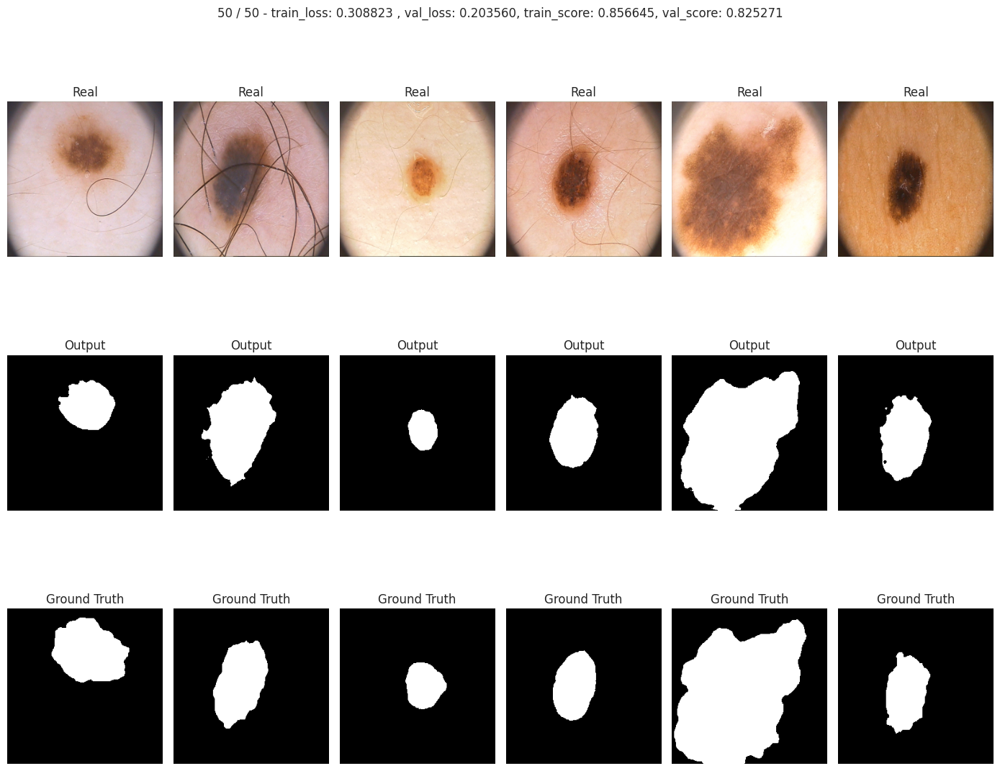

In [256]:
model_lovasz = SegNet(32).to(device)

optimaizer = optim.AdamW(model_lovasz.parameters())
h_segnet_lovasz = train(model_lovasz, optimaizer, lovasz_loss, MAX_EPOCHS, data_tr, data_val)

In [257]:
segnet_lovasz_val_score, segnet_lovasz_test_score = scores(model_lovasz)


Score на валидации: 0.8382, score на тесте: 0.7780


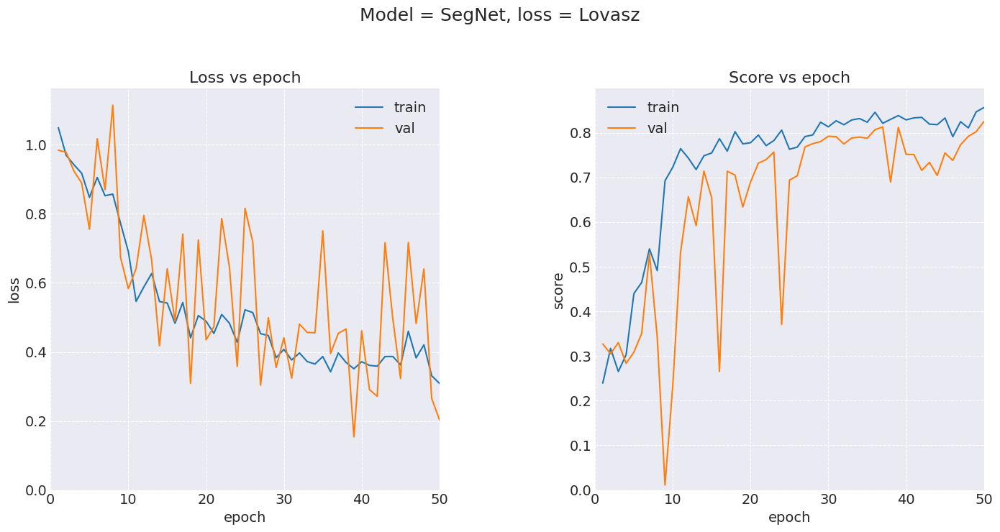

In [258]:
make_graph(h_segnet_lovasz, "SegNet", "Lovasz")

-----------------------------------------------------------------------------------------

# U-Net

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.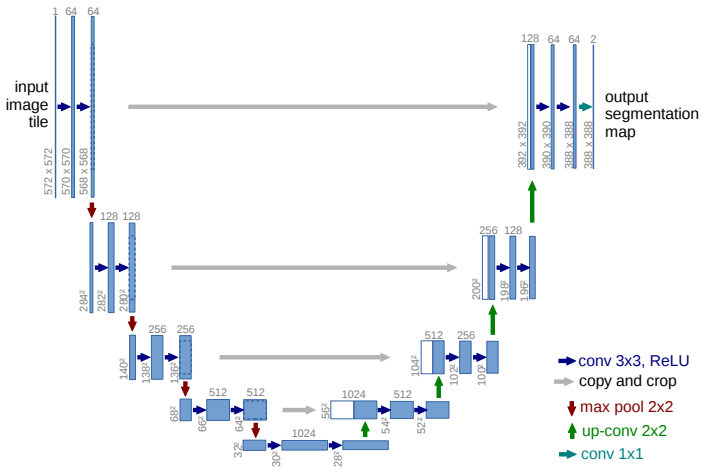

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [259]:
class UNet(nn.Module):
    def __init__(self, fl_ch: int):
        super().__init__()
        """
        fl_ch - First layer channels
        Для быстрого изменеия обучаемых параметров нейросети
        заданим аргумент с количествов выодных каналов после первого слоя свертки
        """
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(2, return_indices=False) # 256 -> 128
        self.enc_conv1 =nn.Sequential(
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch * 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch* 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU()
        )
        self.pool1 =  nn.MaxPool2d(2, return_indices=False)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch * 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch* 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU()
        )
        self.pool2 =  nn.MaxPool2d(2, return_indices=False)# 64 -> 32
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch * 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 8, out_channels = fl_ch* 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU()
        )
        self.pool3 =  nn.MaxPool2d(2, return_indices=False)# 32 -> 16

        # bottleneck
        self.bottleneck_enc = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*16, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*8, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU()
        )
        # decoder (upsampling)
        self.upsample0 = nn.Upsample(scale_factor=2)

        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU()
        )

        self.upsample1 = nn.Upsample(scale_factor=2) # 32 -> 64

        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU()
        )

        self.upsample2 = nn.Upsample(scale_factor=2)  # 64 -> 128

        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        self.upsample3 = nn.Upsample(scale_factor=2)  # 128 -> 256

        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch, out_channels=1, kernel_size=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.pool0(e0)
        e2 = self.enc_conv1(e1)
        e3 = self.pool1(e2)
        e4 = self.enc_conv2(e3)
        e5 = self.pool2(e4)
        e6 = self.enc_conv3(e5)
        e7 = self.pool3(e6)

        # bottleneck
        b = self.bottleneck_enc(e7)

        # decoder
        d0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((d0,e6), dim =1))
        d1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((d1,e4), dim =1))
        d2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((d2,e2), dim =1))
        d3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((d3,e0), dim =1))
        return d3

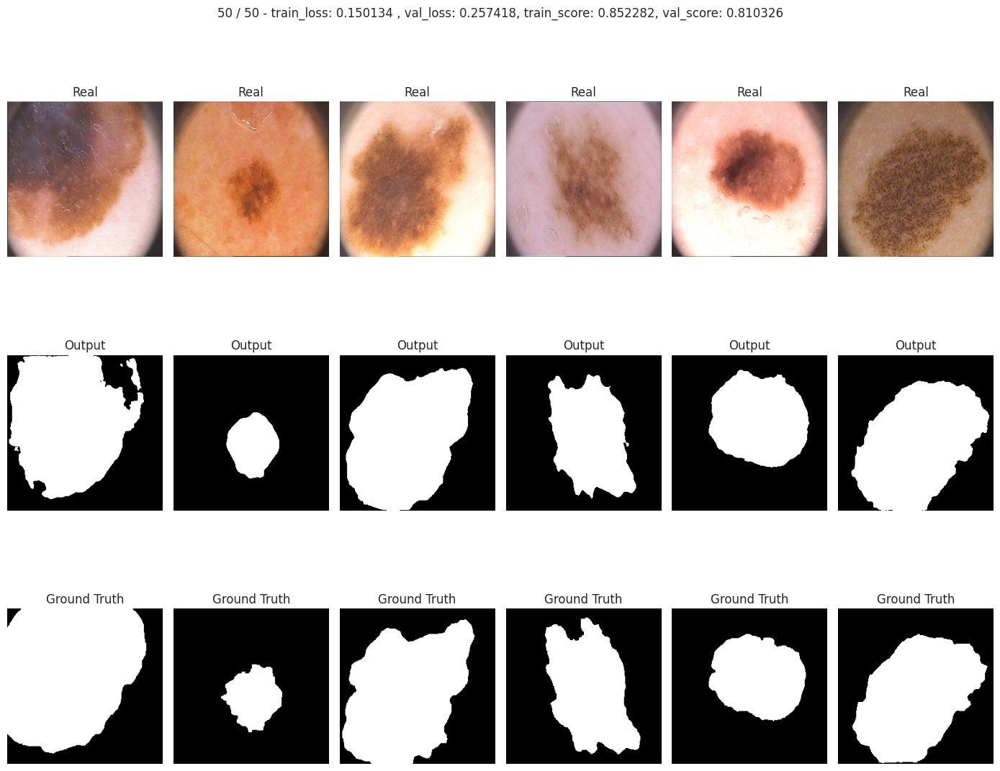

In [260]:
unet_bce = UNet(32).to(device)

optimizer = torch.optim.AdamW(unet_bce.parameters())
h_unet_bce = train(unet_bce, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val)

In [261]:
unet_bce_val_score, unet_bce_test_score = scores(unet_bce)


Score на валидации: 0.8253, score на тесте: 0.7731


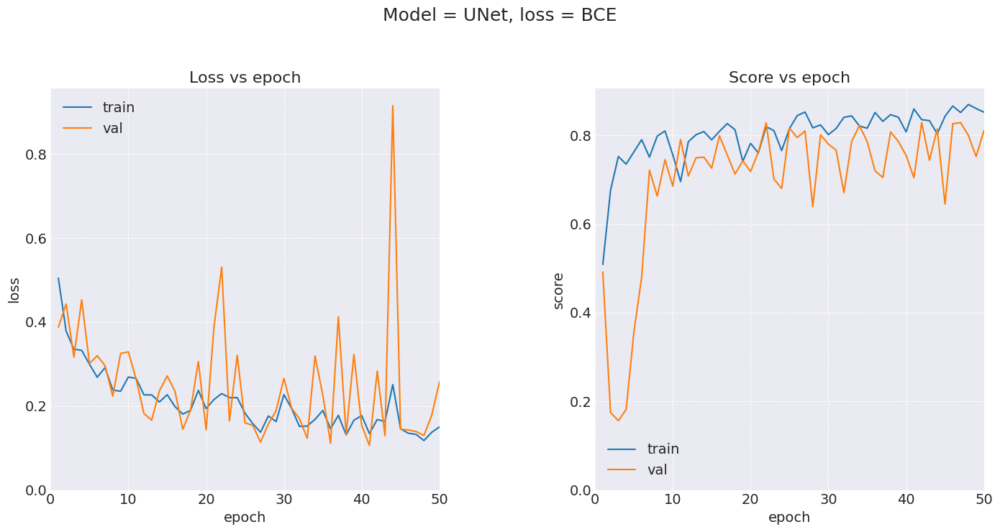

In [262]:
make_graph(h_unet_bce, "UNet", "BCE")

### UNet + dice

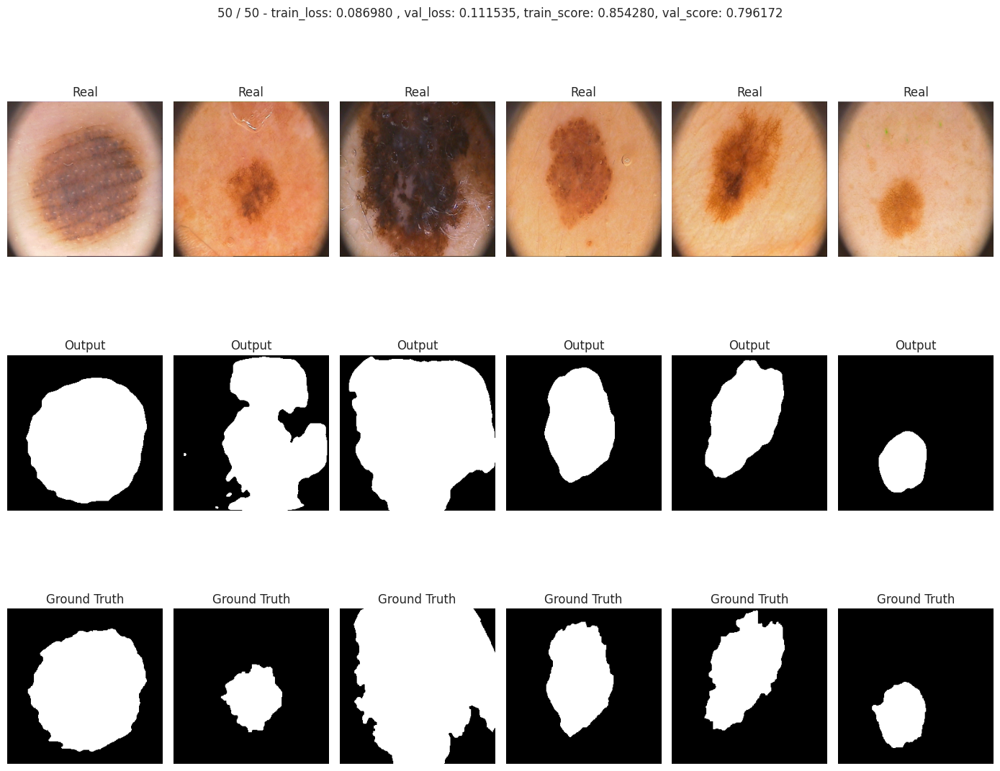

In [263]:
unet_dice = UNet(32).to(device)
optimizer = torch.optim.AdamW(unet_dice.parameters())
h_unet_dice = train(unet_dice, optimizer, dice_loss, MAX_EPOCHS, data_tr, data_val)

In [264]:
unet_dice_val_score, unet_dice_test_score = scores(unet_dice)


Score на валидации: 0.8145, score на тесте: 0.8260


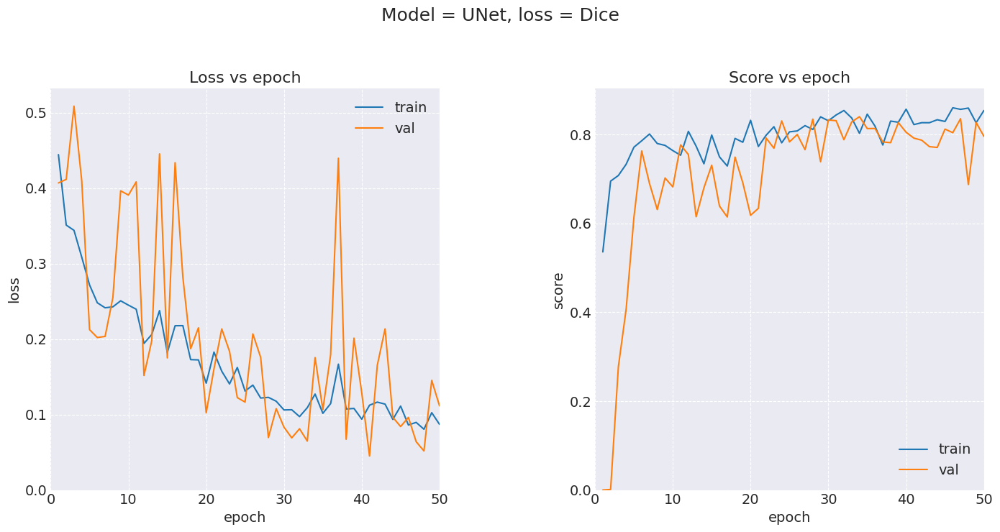

In [265]:
make_graph(h_unet_dice, "UNet", "Dice")

### UNet + focal

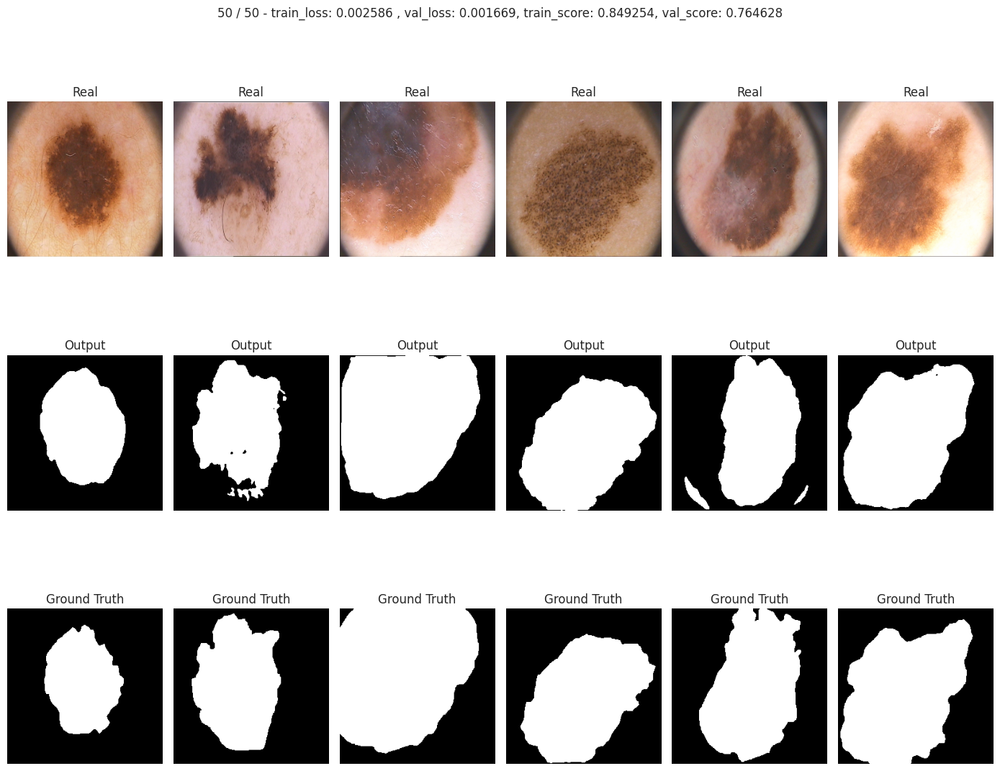

In [266]:
unet_focal = UNet(32).to(device)

optimizer = torch.optim.AdamW(unet_focal.parameters())
h_unet_focal = train(unet_focal, optimizer, focal_loss, MAX_EPOCHS, data_tr, data_val)

In [267]:
unet_focal_val_score, unet_focal_test_score = scores(unet_focal)


Score на валидации: 0.7332, score на тесте: 0.7583


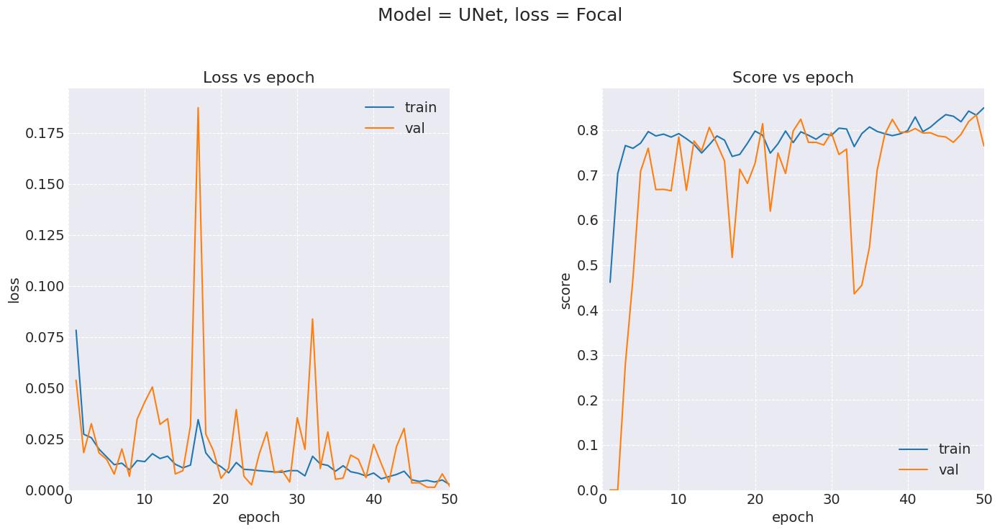

In [268]:
make_graph(h_unet_focal, "UNet", "Focal")

### UNet + Lovasz

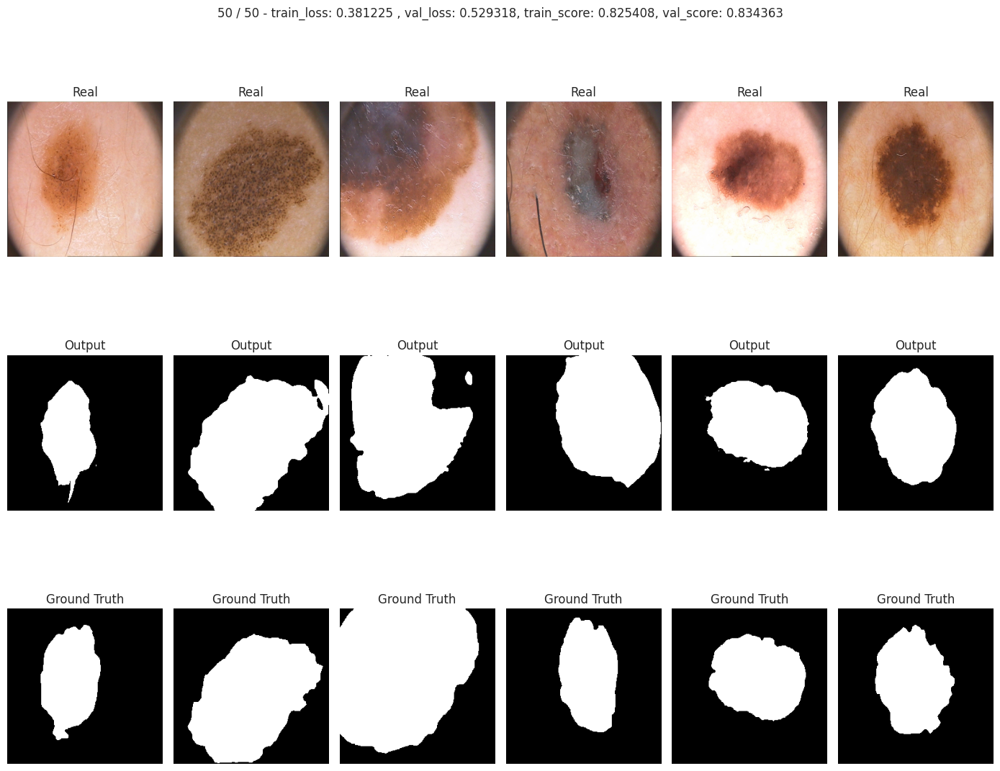

In [269]:
unet_lovasz = UNet(32).to(device)

optimizer = torch.optim.AdamW(unet_lovasz.parameters())
h_unet_lovasz = train(unet_lovasz, optimizer, lovasz_loss, MAX_EPOCHS, data_tr, data_val)

In [270]:
unet_lovasz_val_score, unet_lovasz_test_score = scores(unet_lovasz)


Score на валидации: 0.8292, score на тесте: 0.7495


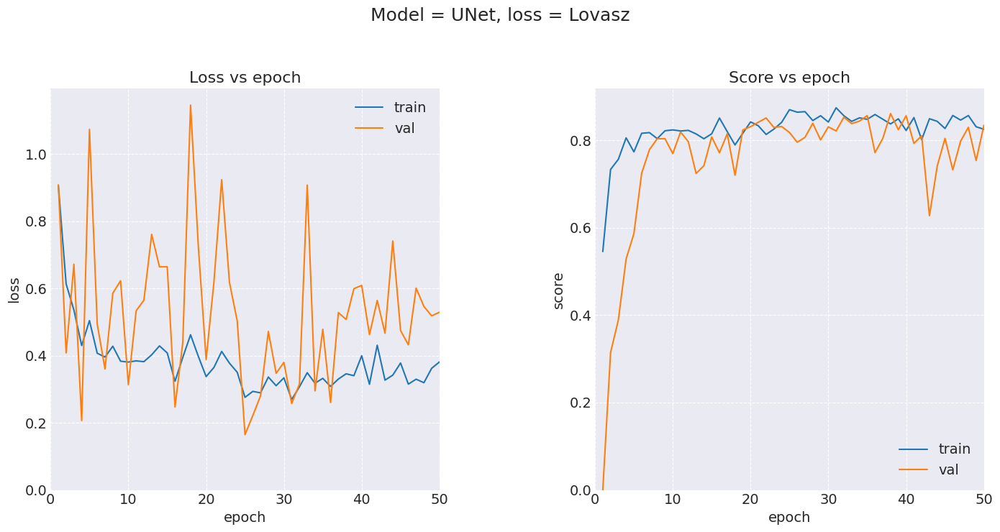

In [271]:
make_graph(h_unet_lovasz, "UNet", "Lovasz")

# U-Net2

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.

In [272]:
class UNet2(nn.Module):
    def __init__(self, fl_ch: int):
        super().__init__()
        """
        fl_ch - First layer channels
        Для быстрого изменеия обучаемых параметров нейросети
        заданим аргумент с количествов выодных каналов после первого слоя свертки
        """
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        self.pool0 = nn.Sequential(nn.Conv2d(in_channels=fl_ch, out_channels = fl_ch,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        ) # 256 -> 128
        self.enc_conv1 =nn.Sequential(
            nn.Conv2d(in_channels = fl_ch, out_channels = fl_ch * 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch* 2, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 2),
            nn.ReLU()
        )
        self.pool1 = nn.Sequential(nn.Conv2d(in_channels=fl_ch*2, out_channels = fl_ch*2,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU()
        )
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 2, out_channels = fl_ch * 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch* 4, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 4),
            nn.ReLU()
        )
        self.pool2 =   nn.Sequential(nn.Conv2d(in_channels=fl_ch*4, out_channels = fl_ch*4,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU()
        )
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels = fl_ch* 4, out_channels = fl_ch * 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU(),
            nn.Conv2d(in_channels = fl_ch* 8, out_channels = fl_ch* 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(fl_ch* 8),
            nn.ReLU()
        )
        self.pool3 =   nn.Sequential(nn.Conv2d(in_channels=fl_ch*8, out_channels = fl_ch*8,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU()
        )

        # bottleneck
        self.bottleneck_enc = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*16, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(fl_ch*16),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*8, kernel_size=3, padding = (1,1)),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU()
        )
        # decoder (upsampling)
        self.upsample0 =  nn.Sequential(nn.ConvTranspose2d(in_channels=fl_ch*8, out_channels = fl_ch*8,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU()
        )

        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*16, out_channels=fl_ch*8, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*8),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU()
        )

        self.upsample1 = nn.Sequential(nn.ConvTranspose2d(in_channels=fl_ch*4, out_channels = fl_ch*4,
                                             kernel_size = 2, stride = 2),
        nn.BatchNorm2d(fl_ch*4),
        nn.ReLU()
        ) # 32 -> 64

        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*8, out_channels=fl_ch*4, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*4),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU()
        )

        self.upsample2 = nn.Sequential(nn.ConvTranspose2d(in_channels=fl_ch*2, out_channels = fl_ch*2,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU()
        )   # 64 -> 128

        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*4, out_channels=fl_ch*2, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch*2),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )
        
        self.upsample3 = nn.Sequential(nn.ConvTranspose2d(in_channels=fl_ch, out_channels = fl_ch,
                                             kernel_size = 2, stride = 2),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU()
        )   

        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=fl_ch*2, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch, out_channels=fl_ch, kernel_size=3, padding = 1),
            nn.BatchNorm2d(fl_ch),
            nn.ReLU(),
            nn.Conv2d(in_channels=fl_ch, out_channels=1, kernel_size=1)
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        e1 = self.pool0(e0)
        e2 = self.enc_conv1(e1)
        e3 = self.pool1(e2)
        e4 = self.enc_conv2(e3)
        e5 = self.pool2(e4)
        e6 = self.enc_conv3(e5)
        e7 = self.pool3(e6)

        # bottleneck
        b = self.bottleneck_enc(e7)

        # decoder
        d0 = self.upsample0(b)
        d0 = self.dec_conv0(torch.cat((d0,e6), dim =1))
        d1 = self.upsample1(d0)
        d1 = self.dec_conv1(torch.cat((d1,e4), dim =1))
        d2 = self.upsample2(d1)
        d2 = self.dec_conv2(torch.cat((d2,e2), dim =1))
        d3 = self.upsample3(d2)
        d3 = self.dec_conv3(torch.cat((d3,e0), dim =1))
        return d3

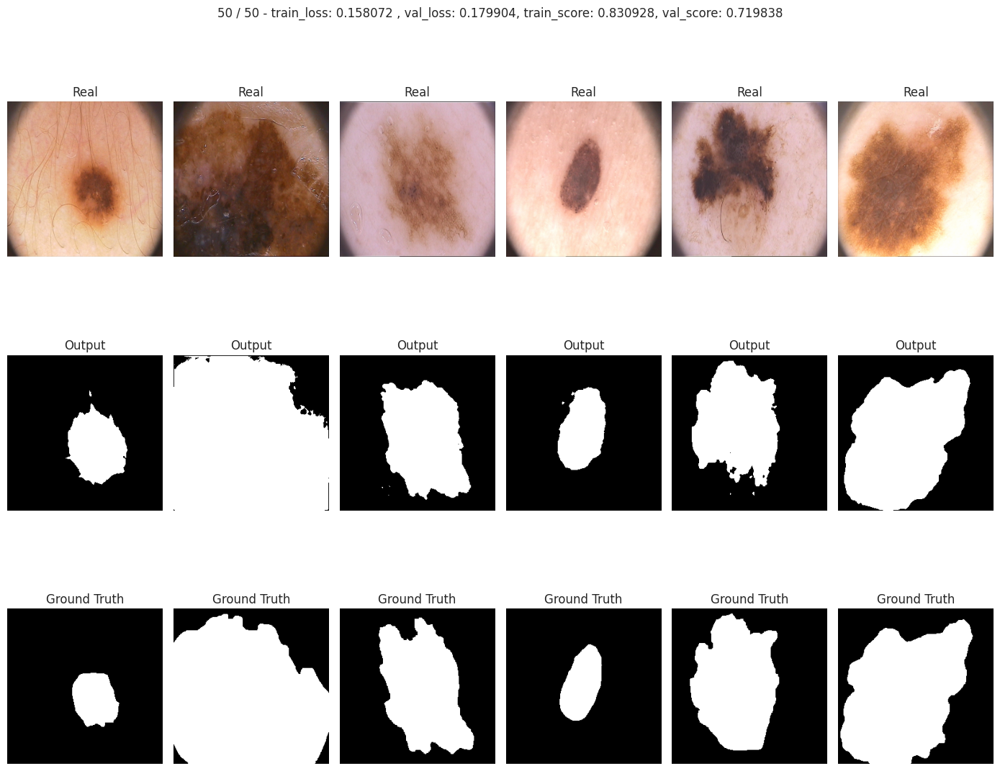

In [273]:
unet2_bce = UNet2(32).to(device)

optimizer = torch.optim.AdamW(unet2_bce.parameters())
h_unet2_bce = train(unet2_bce, optimizer, bce_loss, MAX_EPOCHS, data_tr, data_val)

In [274]:
unet2_bce_val_score, unet2_bce_test_score = scores(unet2_bce)


Score на валидации: 0.8191, score на тесте: 0.7299


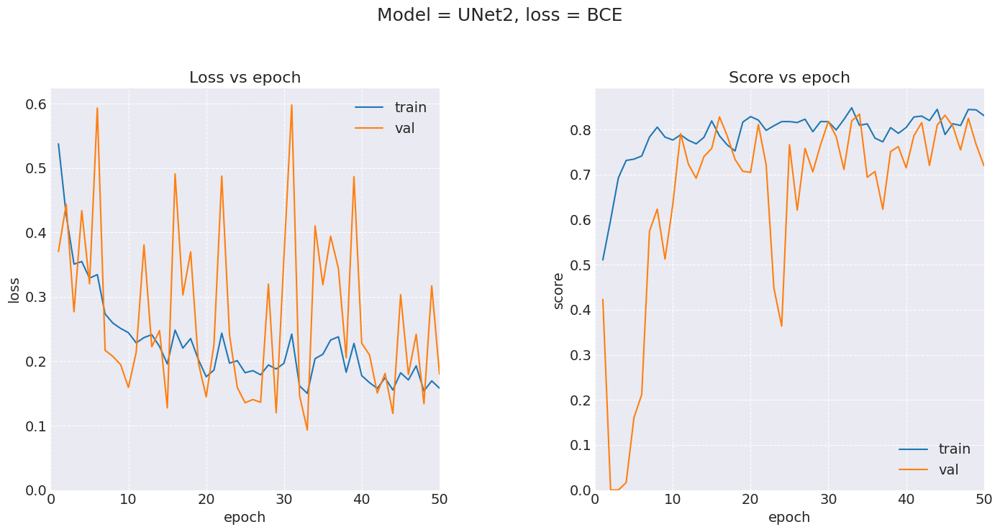

In [275]:
make_graph(h_unet2_bce, "UNet2", "BCE")

### UNet2 + dice

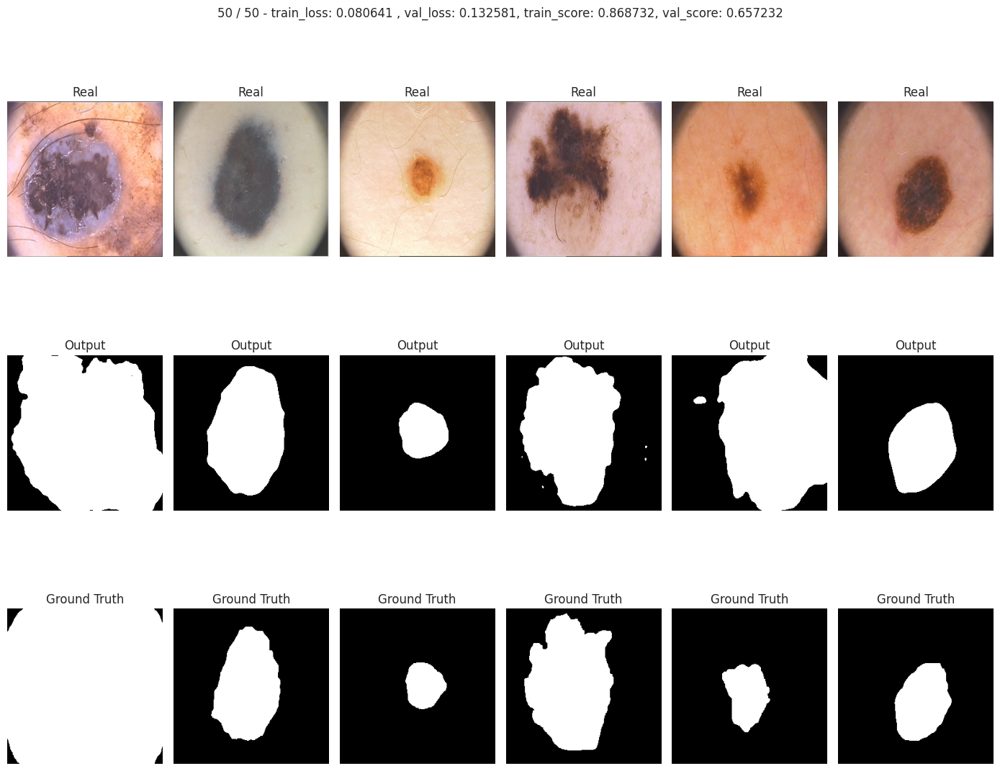

In [320]:
unet2_dice = UNet2(32).to(device)

optimizer = torch.optim.AdamW(unet2_dice.parameters())
h_unet2_dice = train(unet2_dice, optimizer, dice_loss, MAX_EPOCHS, data_tr, data_val)

In [321]:
unet2_dice_val_score, unet2_dice_test_score = scores(unet2_dice)


Score на валидации: 0.7630, score на тесте: 0.6441


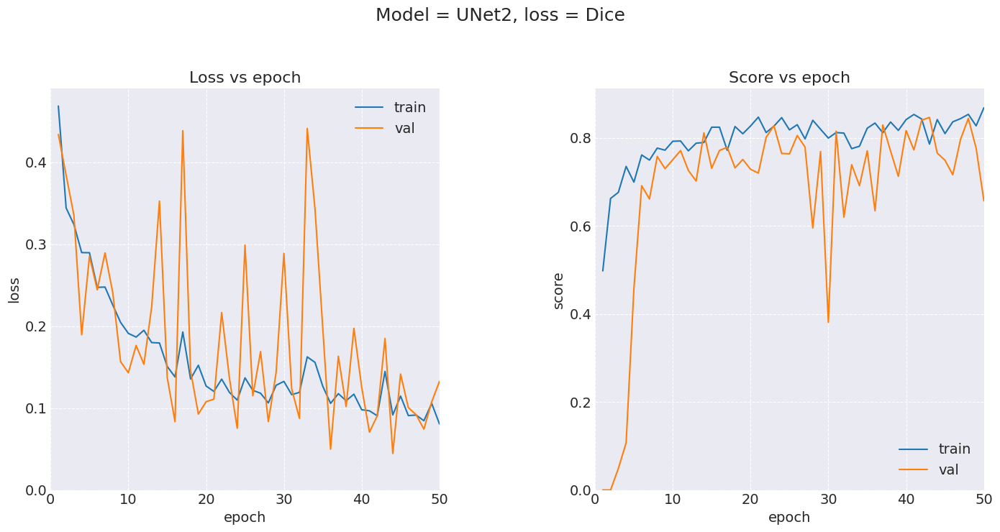

In [322]:
make_graph(h_unet2_dice, "UNet2", "Dice")

### UNet2 + focal

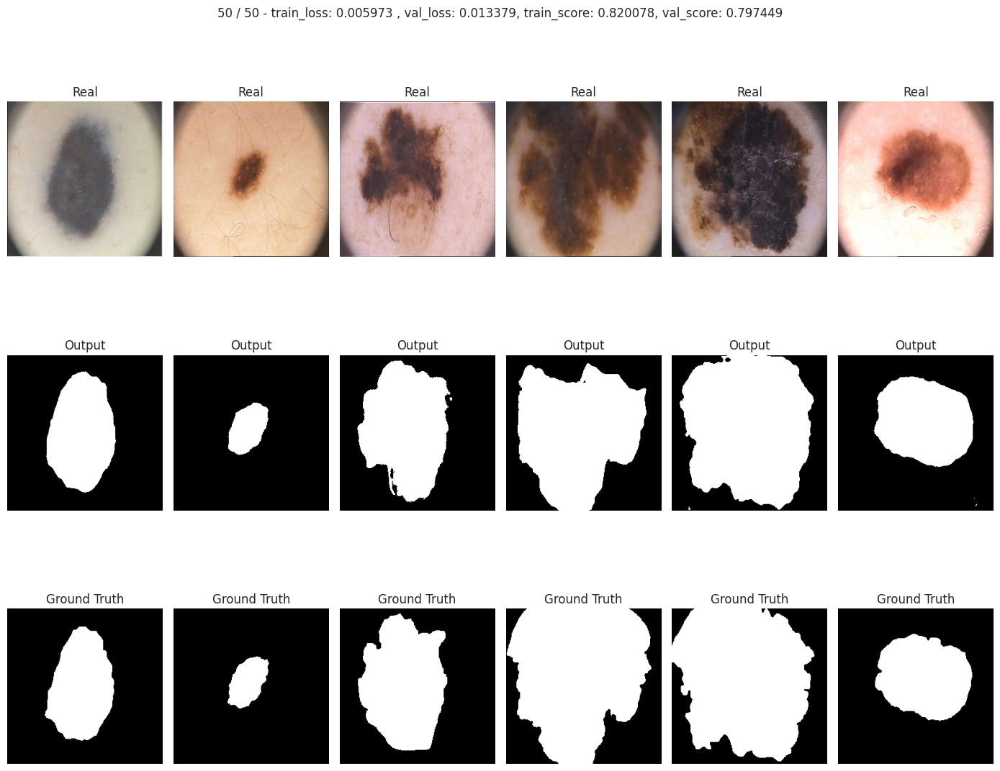

In [279]:
unet2_focal = UNet2(32).to(device)

optimizer = torch.optim.AdamW(unet2_focal.parameters())
h_unet2_focal = train(unet2_focal, optimizer, focal_loss, MAX_EPOCHS, data_tr, data_val)

In [280]:
unet2_focal_val_score, unet2_focal_test_score = scores(unet2_focal)


Score на валидации: 0.7304, score на тесте: 0.7156


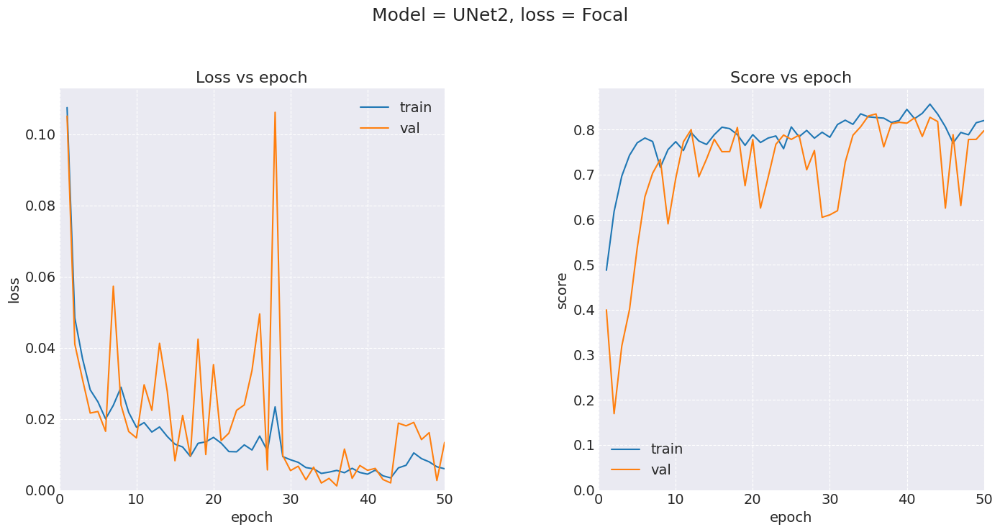

In [281]:
make_graph(h_unet2_focal, "UNet2", "Focal")

### UNet2 + Lovasz

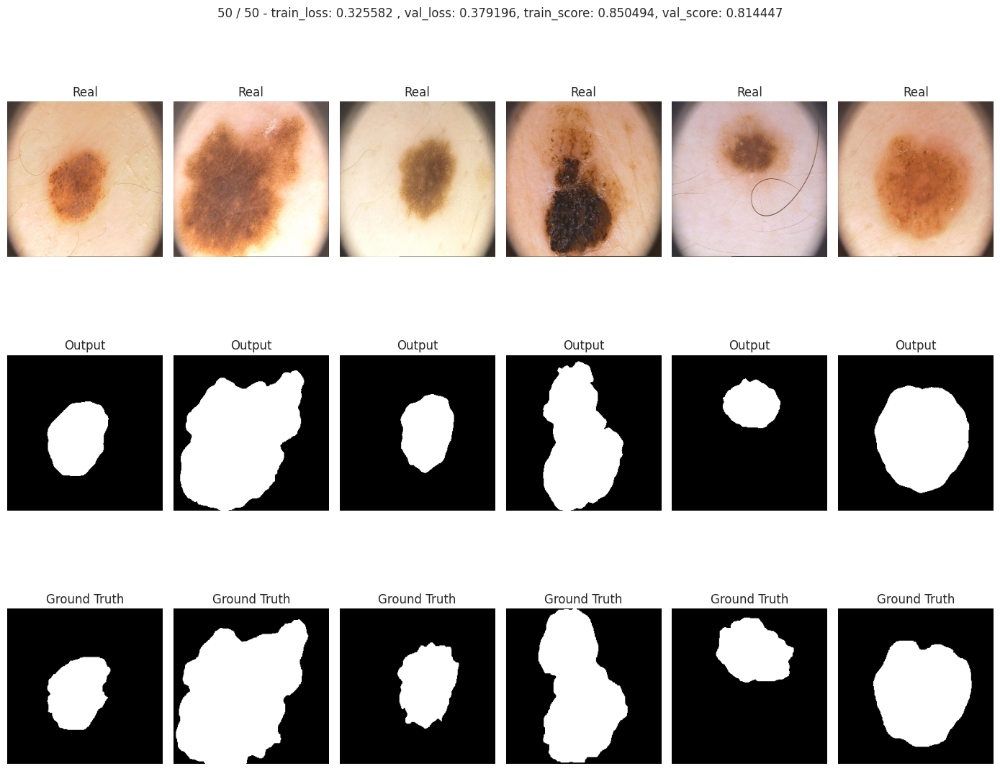

In [282]:
unet2_lovasz = UNet2(32).to(device)

optimizer = torch.optim.AdamW(unet2_lovasz.parameters())
h_unet2_lovasz = train(unet2_lovasz, optimizer, lovasz_loss, MAX_EPOCHS, data_tr, data_val)

In [283]:
unet2_lovasz_val_score, unet2_lovasz_test_score = scores(unet2_lovasz)


Score на валидации: 0.8171, score на тесте: 0.8389


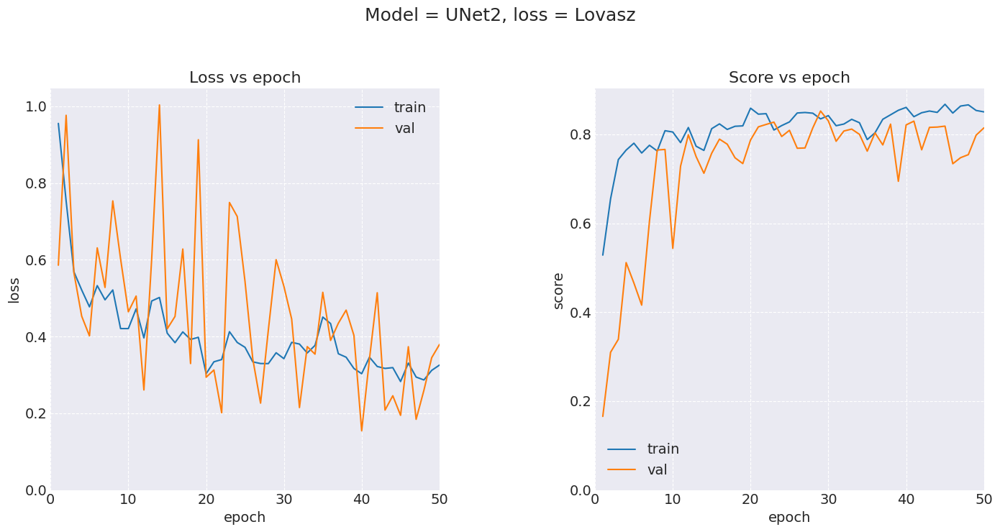

In [317]:
make_graph(h_unet2_lovasz, "UNet2", "Lovasz")

# Отчет

## Анализ лоссов

In [333]:
def plot_graph_report(ax, x, y1, y2, y3, y4, arg1):
  ax.plot(x, y1, label = "BCE", color = "green", linestyle = 'dashed')
  ax.plot(x, y2, label = "Dice", color = "red", linestyle = 'dotted')
  ax.plot(x, y3, label = "Focal", color = "blue", linestyle = 'dashdot')
  ax.plot(x, y4, label = "Lovasz", color = "orange", linestyle = 'solid')
  ax.legend(fontsize = 12)
  ax.grid(linestyle = "--")
  ax.tick_params(labelsize = 12)
  ax.set_xlabel("epoch", fontsize = 12)
  ax.set_ylabel(arg1, fontsize = 12)
  ax.set_title("Model Comparison", fontsize = 14)

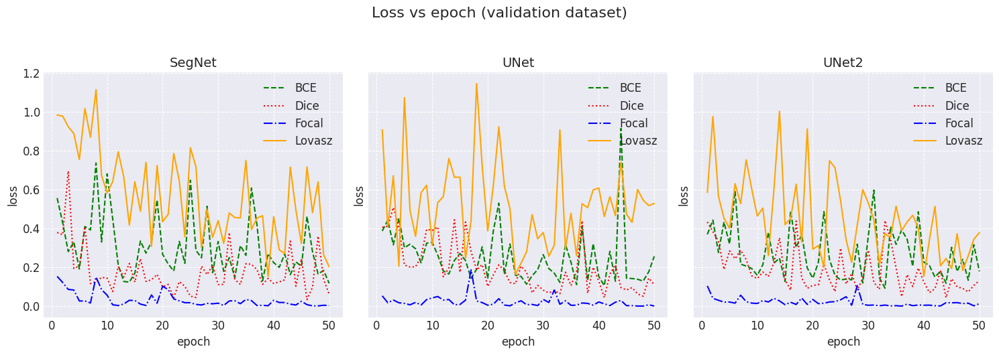

In [338]:
x = np.arange(MAX_EPOCHS)+1
fig, ax = plt.subplots(1, 3, figsize = (15, 5), sharey = True)

y1 = h_segnet_bce["val"]["loss"]
y2 = h_segnet_dice["val"]["loss"]
y3 = h_segnet_focal["val"]["loss"]
y4 = h_segnet_lovasz["val"]["loss"]
plot_graph_report(ax[0], x, y1, y2, y3, y4, "loss")
ax[0].set_title("SegNet", fontsize = 14)

y1 = h_unet_bce["val"]["loss"]
y2 = h_unet_dice["val"]["loss"]
y3 = h_unet_focal["val"]["loss"]
y4 = h_unet_lovasz["val"]["loss"]
plot_graph_report(ax[1], x, y1, y2, y3, y4, "loss")
ax[1].set_title("UNet", fontsize = 14)

y1 = h_unet2_bce["val"]["loss"]
y2 = h_unet2_dice["val"]["loss"]
y3 = h_unet2_focal["val"]["loss"]
y4 = h_unet2_lovasz["val"]["loss"]
plot_graph_report(ax[2], x, y1, y2, y3, y4, "loss")
ax[2].set_title("UNet2", fontsize = 14)

plt.suptitle(f"Loss vs epoch (validation dataset)", fontsize = 16, y=1.05)
plt.tight_layout()

По данным графикам можно сказать что lovasz имеет самые большие значения, а focal - самые маленькие. Маленькие лоссы не могут гарантировать качественного обучения. Dice и BCE имеют близкие значения.

## Анализ скоров

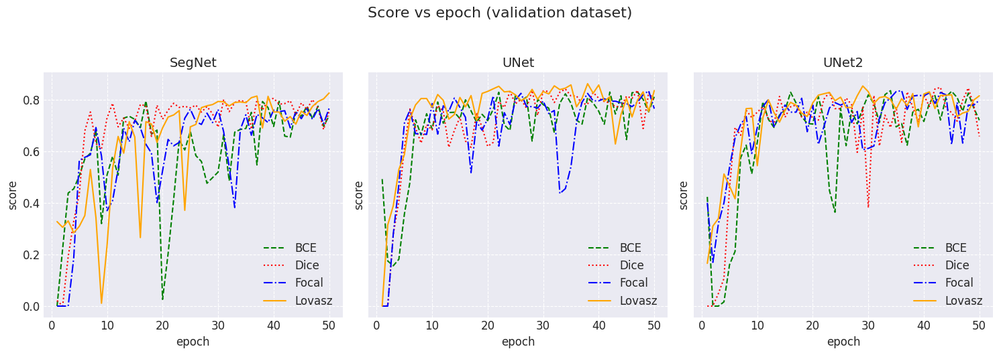

In [339]:
x = np.arange(MAX_EPOCHS)+1
fig, ax = plt.subplots(1, 3, figsize = (15, 5), sharey = True)

y1 = h_segnet_bce["val"]["score"]
y2 = h_segnet_dice["val"]["score"]
y3 = h_segnet_focal["val"]["score"]
y4 = h_segnet_lovasz["val"]["score"]
plot_graph_report(ax[0], x, y1, y2, y3, y4, "score")
ax[0].set_title("SegNet", fontsize = 14)

y1 = h_unet_bce["val"]["score"]
y2 = h_unet_dice["val"]["score"]
y3 = h_unet_focal["val"]["score"]
y4 = h_unet_lovasz["val"]["score"]
plot_graph_report(ax[1], x, y1, y2, y3, y4, "score")
ax[1].set_title("UNet", fontsize = 14)

y1 = h_unet2_bce["val"]["score"]
y2 = h_unet2_dice["val"]["score"]
y3 = h_unet2_focal["val"]["score"]
y4 = h_unet2_lovasz["val"]["score"]
plot_graph_report(ax[2], x, y1, y2, y3, y4, "score")
ax[2].set_title("UNet2", fontsize = 14)

plt.suptitle(f"Score vs epoch (validation dataset)", fontsize = 16, y=1.05)
plt.tight_layout()

По графикам можно увидеть, что архитектура UNet наилучшем образом показала себя в данной задаче. так как со всеми лоссами значение метрики лежат около 0.8. Данный результат для SegNet удалось достигнуть только с loss'ом Lovasz. 

## Анализ скора на тестовом датасете

In [342]:
y = [segnet_bce_test_score, segnet_dice_test_score, segnet_focal_test_score, segnet_lovasz_test_score,
     unet_bce_test_score, unet_dice_test_score, unet_focal_test_score, unet_lovasz_test_score,
     unet2_bce_test_score, unet2_dice_test_score, unet2_focal_test_score, unet2_lovasz_test_score]

x = ['segnet_bce', 'segnet_dice', 'segnet_focal', 'segnet_lovasz',
     'unet_bce', 'unet_dice', 'unet_focal', 'unet_lovasz',
     'unet2_bce', 'unet2_dice', 'unet2_focal', 'unet2_lovasz']

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


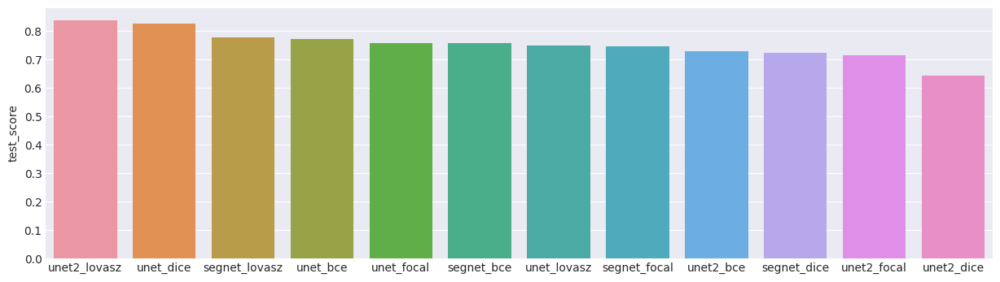

In [361]:
scores = pd.DataFrame(y, x, columns = ['test_score']).sort_values('test_score', ascending = False)
sns.barplot(x=scores.index, y=scores['test_score']);

In [362]:
scores.head()

,test_score
unet2_lovasz,0.838933
unet_dice,0.826000
segnet_lovasz,0.778008
unet_bce,0.773072
unet_focal,0.758295


Видно, что **Лучшей моделью стала UNet2 + lovasz**. В топ-5 моделей 3 раза встречается UNet, что говорит о стабильности данной модели. Также стоит отметить что Лосс lovasz 2 раза встречается в топе с двумя разными архитектурами.

## Общий вывод
В ходе данной работы были проанализированы 3 архитектуры: SegNet, Unet и Unet2, а также слдеюущие лоссы: BCE, Dice, Focal и Lovasz. 

1. **Самая стабильная архитектура - UNet**
2. **Оптимальный лосс - lovasz**
Модель, лучше всего показавшая себя на тестовом датасете:

**UNet2 + lovasz** 

Исследование проводилось в следующих услвоиях: Количество эпох - 50 для всех моделей, Оптимизатор AdamW без дополнительной настройки.

Как можно было бы улучшить результат:
1. Попробовать аугментировать данные(по сути это фотографии, а у всех фотографий могут быть одинаковые проблемы)
2. Настроить Sheduler для борьбы с переобучением.
3. Существует еще много Loss функций, можно попробовать еще что-то.

Данный ноутбук можно прогнать примерно за час на Kaggle, все нейросети обучаются быстро, память очищается в цикле обучения.